In [38]:
from pathlib import Path

# video_path = Path("../data/5fa4c21a04bc5912180291bc_q2_generic.mp4")
video_path = Path("../data/5ee232f2b970662cfa352567_q3_personality.mp4")

In [39]:
import moviepy as mp

video = mp.VideoFileClip(video_path)
video.display_in_notebook(maxduration=500)

MoviePy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


chunk:   0%|          | 0/1564 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing video __temp__.mp4



MoviePy - Done !
MoviePy - video ready __temp__.mp4


In [52]:
import cv2
import numpy as np
import moviepy as mp

# import torch
import torchaudio
from pathlib import Path


def split_video_on_silence(
    video_path: Path,
    silence_threshold: int = -40,
    min_silence_duration: float = 0.0025,
):
    video = mp.VideoFileClip(video_path)
    audio_path = video_path.with_suffix(".wav")
    video.audio.write_audiofile(audio_path)

    video = cv2.VideoCapture(str(video_path))
    waveform, sr = torchaudio.load(str(audio_path))
    waveform = waveform.mean(dim=0)  # convert to mono

    # Detect silence
    db = torchaudio.transforms.AmplitudeToDB()(waveform)
    silence_mask = db < silence_threshold

    # Find silent segments
    silent_segments = []
    start = None
    for i, is_silent in enumerate(silence_mask):
        if is_silent and start is None:
            start = i
        elif not is_silent and start is not None:
            if (i - start) / sr >= min_silence_duration:
                silent_segments.append((start / sr, i / sr))
            start = None
    if start is not None:
        silent_segments.append((start / sr, len(waveform) / sr))

    # Split video
    video_parts = []
    prev_end_time = 0
    for start_time, end_time in silent_segments:
        if prev_end_time < start_time:
            video.set(cv2.CAP_PROP_POS_MSEC, prev_end_time * 1000)
            success, frame = video.read()
            frames = []
            while success and video.get(cv2.CAP_PROP_POS_MSEC) < start_time * 1000:
                frames.append(frame)
                success, frame = video.read()
            video_parts.append(np.array(frames))
        prev_end_time = end_time

    video.release()
    return video_parts

In [53]:
parts = split_video_on_silence(video_path)
for i, part in enumerate(parts):
    print(f"Part {i+1}: {len(part)} frames")

MoviePy - Writing audio in ../data/5ee232f2b970662cfa352567_q3_personality.wav


MoviePy - Done.
Part 1: 25 frames
Part 2: 1 frames
Part 3: 0 frames
Part 4: 2 frames
Part 5: 19 frames
Part 6: 4 frames
Part 7: 2 frames
Part 8: 1 frames
Part 9: 6 frames
Part 10: 1 frames
Part 11: 1 frames
Part 12: 1 frames
Part 13: 1 frames
Part 14: 19 frames
Part 15: 1 frames
Part 16: 0 frames
Part 17: 0 frames
Part 18: 17 frames
Part 19: 0 frames
Part 20: 1 frames
Part 21: 1 frames
Part 22: 0 frames
Part 23: 1 frames
Part 24: 1 frames
Part 25: 0 frames
Part 26: 1 frames
Part 27: 1 frames
Part 28: 1 frames
Part 29: 1 frames
Part 30: 0 frames
Part 31: 28 frames
Part 32: 29 frames
Part 33: 3 frames
Part 34: 7 frames
Part 35: 6 frames
Part 36: 0 frames
Part 37: 1 frames
Part 38: 1 frames
Part 39: 1 frames
Part 40: 0 frames
Part 41: 3 frames
Part 42: 35 frames
Part 43: 1 frames
Part 44: 1 frames
Part 45: 3 frames
Part 46: 2 frames
Part 47: 26 frames
Part 48: 1 frames
Part 49: 4 frames
Part 50: 1 frames
Part 51: 1 frames
Part 52: 8 frames
Part 53: 2 frames
Part 54: 2 frames
Part 55: 10 f

In [57]:
parts[0].shape

(25, 480, 640, 3)

In [ ]:
import cv2

cv2.imread("00002.png", cv2.IMREAD_COLOR_RGB)

array([[[127, 127, 127],
        [127, 127, 127],
        [127, 127, 127],
        ...,
        [127, 127, 127],
        [127, 127, 127],
        [127, 127, 127]],

       [[127, 127, 127],
        [127, 127, 127],
        [127, 127, 127],
        ...,
        [127, 127, 127],
        [127, 127, 127],
        [127, 127, 127]],

       [[127, 127, 127],
        [127, 127, 127],
        [127, 127, 127],
        ...,
        [127, 127, 127],
        [127, 127, 127],
        [127, 127, 127]],

       ...,

       [[127, 127, 127],
        [127, 127, 127],
        [127, 127, 127],
        ...,
        [127, 127, 127],
        [127, 127, 127],
        [127, 127, 127]],

       [[127, 127, 127],
        [127, 127, 127],
        [127, 127, 127],
        ...,
        [127, 127, 127],
        [127, 127, 127],
        [127, 127, 127]],

       [[127, 127, 127],
        [127, 127, 127],
        [127, 127, 127],
        ...,
        [127, 127, 127],
        [127, 127, 127],
        [127, 127, 127]]

In [6]:
import torch

ndarray = torch.zeros(224, 224, 3).to(torch.uint8).numpy()

cv2.imwrite("temp.png", ndarray)

True

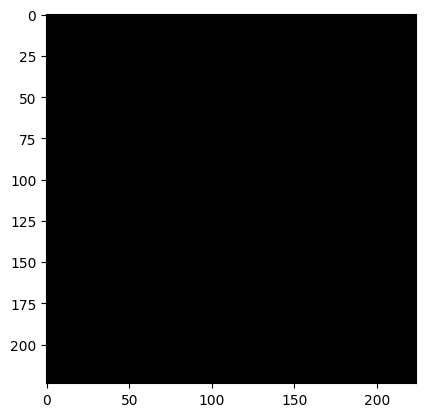

In [9]:
import matplotlib.pyplot as plt

img = cv2.imread('temp.png')
plt.imshow(img)